# Bounding boxes for NWPU dataset

**Tasks**
- Check out data and preprocess
- Create largest object classifier
- Create largest BB classifier (might be crappy)

In [1]:
%matplotlib inline

In [2]:
from pathlib import Path
import json
from collections import defaultdict
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
from fastai.conv_learner import *
from fastai.dataset import *
import tqdm
from matplotlib import patches, patheffects

/home/s/S.Rasp/miniconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/s/S.Rasp/miniconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/s/S.Rasp/miniconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/s/S.Rasp/miniconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/s/S.Rasp/miniconda3/envs/fastai/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module

In [3]:
PATH = Path('/local/S.Rasp/NWPW-VHR-10')
!ls $PATH

ground-truth  negative-image-set  positive-image-set  readme.txt


## Check out data

### Plot some images

In [4]:
IMG_PATH = (PATH/'positive-image-set')

In [5]:
img_fns = [str(i).zfill(3) + '.jpg' for i in range(1, 651)]

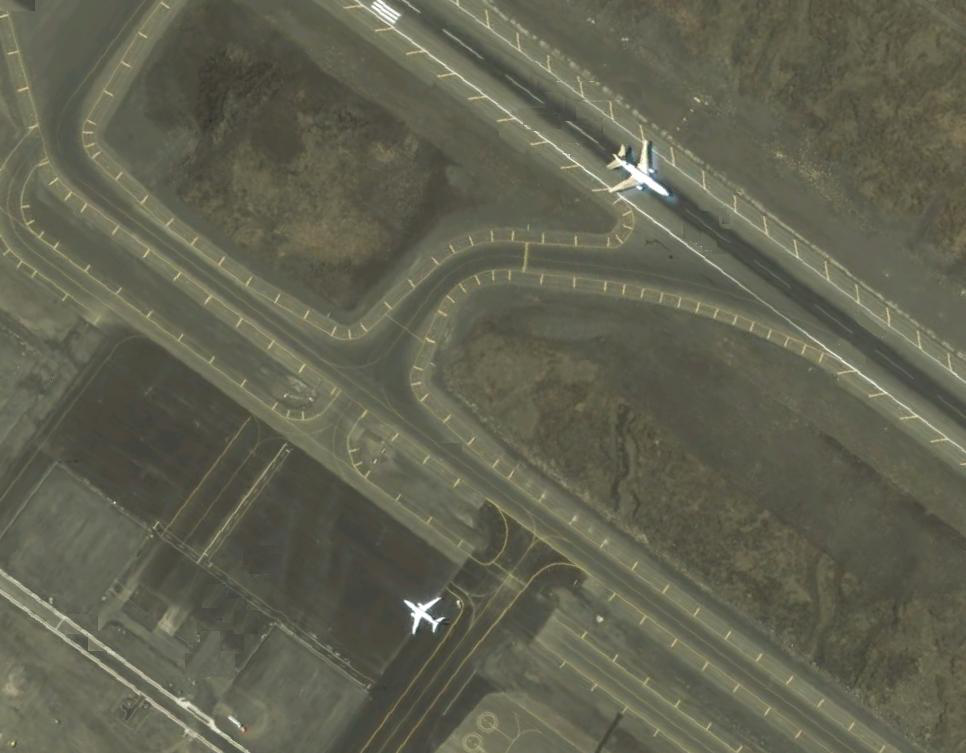

In [6]:
Image.open(IMG_PATH / img_fns[4])

### Read in bounding box data

In [7]:
for l in (PATH/'ground-truth/003.txt').open():
    print(l)

(100,256),(170,319),1 

(575,139),(668,240),1 

(753,382),(843,484),1 

(313,648),(415,764),1 

(434,674),(527,787),1 



In [8]:
cols = ['bb1', 'bb2', 'bb3', 'bb4', 'class']

In [9]:
df = pd.read_csv(PATH/'ground-truth/002.txt', sep=',', header=None, names=cols)

In [10]:
df.head()

,bb1,bb2,bb3,bb4,class
0,(575,114),(635,162),1
1,( 72,305),(133,369),1
2,(210,317),(273,384),1
3,(306,374),(344,420),1
4,(447,531),(535,632),1


In [11]:
df.dtypes

bb1      object
bb2      object
bb3      object
bb4      object
class     int64
dtype: object

In [12]:
for c in cols[:-1]: 
    df[c] = df[c].str.replace('(', '')
    df[c] = df[c].str.replace(')', '')
    df[c] = df[c].astype(int)

In [13]:
df

,bb1,bb2,bb3,bb4,class
0,575,114,635,162,1
1,72,305,133,369,1
2,210,317,273,384,1
3,306,374,344,420,1
4,447,531,535,632,1
5,546,605,625,707,1
6,632,680,720,790,1


In [14]:
np.array(df.iloc[0, :4])

array([575, 114, 635, 162])

In [335]:
def swap_xy(a): return np.array([a[1],a[0],a[3], a[2]])

In [338]:
bbs = defaultdict(list)
for i in range(1, 651):
    df = pd.read_csv(PATH/f'ground-truth/{str(i).zfill(3)}.txt', sep=',', header=None, names=cols)
    for c in cols[:-1]: 
        df[c] = df[c].str.replace('(', '')
        df[c] = df[c].str.replace(')', '')
        df[c] = df[c].astype(int)
    for idx in df.index:
        bb = np.array(df.iloc[idx, :4])
        cls = int(df.iloc[idx, 4])-1
        bbs[img_fns[i-1]].append([cls, swap_xy(bb)])

### Plot image with bbs

In [112]:
cats = ['airplane', 'ship', 'storage-tank', 'baseball-diamond', 'tennis-court', 
        'basketball-court', 'ground-track-field', 'harbor', 'bridge', 'vehicle']

In [341]:
def bb_hw_mine(a): return np.array([a[0],a[1],a[2]-a[0],a[3]-a[1]])
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1],a[2]-a[0]])

In [18]:
def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

In [339]:
def plot_img_bb(img_id):
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    img_fn = img_fns[img_id]
    img = Image.open(IMG_PATH / img_fn)
    ax.imshow(img)
    for o in bbs[img_fn]:
        cat, bb  = o[0], bb_hw_f(o[1])
        p = ax.add_patch(patches.Rectangle(bb[:2], *bb[-2:], fill=False, edgecolor='w'))
        draw_outline(p, 2)
        t = ax.text(bb[0], bb[1], cats[cat], color='w', fontsize=12, 
                    verticalalignment='top')
        draw_outline(t, 2)

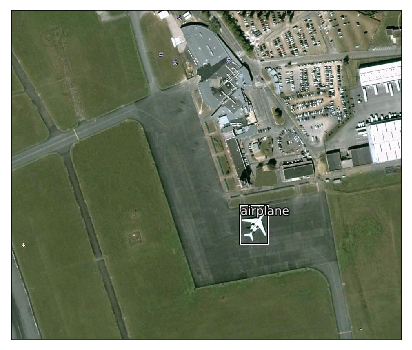

In [340]:
plot_img_bb(0)

## Classifier for most common object (by size)

In [188]:
bbs

defaultdict(list,
            {'001.jpg': [[0, array([563, 478, 630, 573])]],
             '002.jpg': [[0, array([575, 114, 635, 162])],
              [0, array([ 72, 305, 133, 369])],
              [0, array([210, 317, 273, 384])],
              [0, array([306, 374, 344, 420])],
              [0, array([447, 531, 535, 632])],
              [0, array([546, 605, 625, 707])],
              [0, array([632, 680, 720, 790])]],
             '003.jpg': [[0, array([100, 256, 170, 319])],
              [0, array([575, 139, 668, 240])],
              [0, array([753, 382, 843, 484])],
              [0, array([313, 648, 415, 764])],
              [0, array([434, 674, 527, 787])]],
             '004.jpg': [[0, array([227, 106, 268, 155])],
              [0, array([318, 126, 370, 185])],
              [0, array([445,  88, 516, 168])],
              [0, array([363, 336, 438, 420])],
              [0, array([455, 331, 529, 415])],
              [0, array([ 68, 316, 170, 411])],
              [0, array

In [34]:
def size(bb):
    _, _, h, w = bb_hw(bb)
    return h*w

In [63]:
def get_largest_area(bb):
    df = pd.DataFrame({'cat': [a[0] for a in bb], 'size': [size(a[1]) for a in bb]})
    return df.groupby('cat').sum().sort_values('size', ascending=False).index[0]

In [68]:
get_largest_area(bbs[img_fns[150]])

5

In [69]:
cat_lrg = [get_largest_area(bbs[img_fn]) for img_fn in img_fns]

In [113]:
df = pd.DataFrame({'fn': img_fns, 'cat': [cats[c] for c in cat_lrg]})

In [114]:
df.tail()

,fn,cat
645,646.jpg,baseball-diamond
646,647.jpg,ground-track-field
647,648.jpg,ground-track-field
648,649.jpg,basketball-court
649,650.jpg,basketball-court


In [115]:
CSV_PATH = PATH / 'lrg_df.csv'
df.to_csv(CSV_PATH, index=False)

In [116]:
!head $CSV_PATH

fn,cat
001.jpg,airplane
002.jpg,airplane
003.jpg,airplane
004.jpg,airplane
005.jpg,airplane
006.jpg,airplane
007.jpg,airplane
008.jpg,airplane
009.jpg,airplane


In [117]:
f_model = resnet34
sz=500
bs=16

In [235]:
tfms = tfms_from_model(f_model, sz, aug_tfms=transforms_top_down, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(PATH, 'positive-image-set', CSV_PATH, tfms=tfms, bs=bs)

In [157]:
md.val_y.shape

(130,)

In [122]:
x,y=next(iter(md.val_dl))

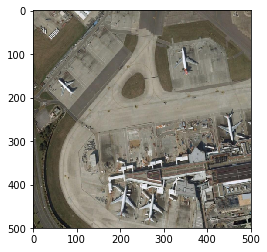

In [123]:
plt.imshow(md.val_ds.denorm(to_np(x))[0])

In [236]:
learn = ConvLearner.pretrained(f_model, md, metrics=[accuracy])
learn.opt_fn = optim.Adam

In [237]:
learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 500, 500]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('trainable', False),
                           ('nb_params', 9408)])),
             ('BatchNorm2d-2',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('trainable', False),
                           ('nb_params', 128)])),
             ('ReLU-3',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('nb_params', 0)])),
             ('MaxPool2d-4',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 125, 125]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 64, 12

In [125]:
md.val_y.shape, md.trn_y.shape

((130,), (520,))

In [126]:
lrf=learn.lr_find()

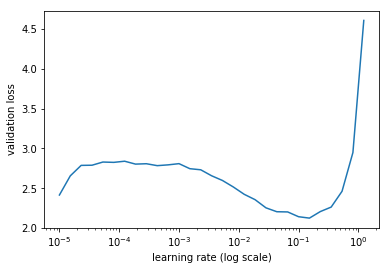

In [128]:
learn.sched.plot(0, 0)

In [131]:
lr = 5e-3

In [129]:
learn.fit(5e-3, 1, cycle_len=1)

epoch      trn_loss   val_loss   accuracy                 
    0      1.245466   0.678989   0.823077  


[array([0.67899]), 0.823076923076923]

In [132]:
lrs = np.array([lr/1000,lr/100,lr])

In [133]:
learn.freeze_to(-2)

In [134]:
learn.fit(lrs, 2, cycle_len=2)

epoch      trn_loss   val_loss   accuracy                  
    0      0.832687   0.523758   0.876923  
    1      0.545538   0.47453    0.846154                  
    2      0.454212   0.39506    0.884615                  
    3      0.357478   0.364458   0.9                       


[array([0.36446]), 0.9]

In [166]:
dl = iter(md.val_dl)

In [178]:
x,y = next(dl)
probs = F.softmax(predict_batch(learn.model, x), -1)
x,preds = to_np(x),to_np(probs)
preds = np.argmax(preds, -1)

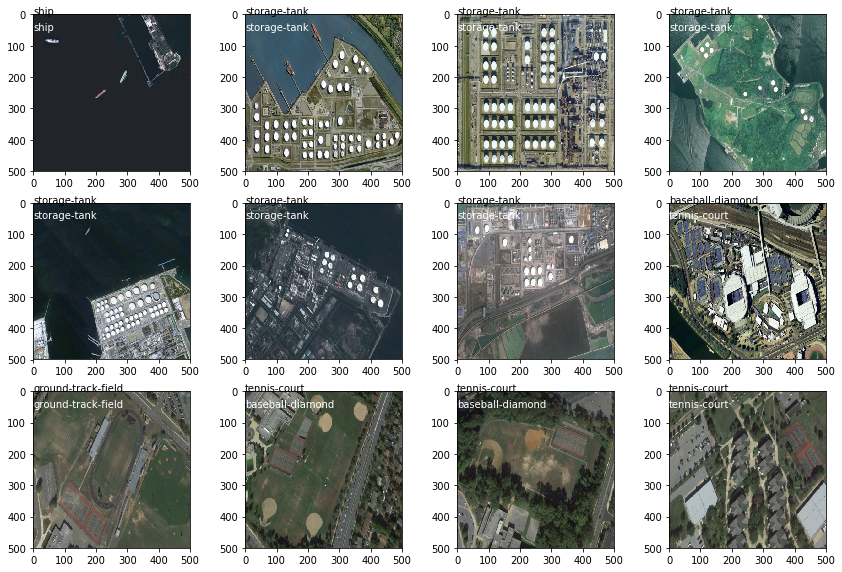

In [179]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    b = md.classes[preds[i]]
    ax.imshow(ima)
    ax.text(0, 0, b)
    ax.text(0, 50, md.classes[y[i]], color='w')
plt.tight_layout()

## Predict largest bounding box

In [342]:
def get_lrg(b):
    if not b: raise Exception()
    b = sorted(b, key=lambda x: size(x[1]), reverse=True)
    return b[0]

In [343]:
bbs[img_fns[604]]

[[6, array([ 66, 408, 278, 746])],
 [3, array([210, 274, 304, 394])],
 [3, array([310,  78, 391, 167])]]

In [344]:
get_lrg(bbs[img_fns[604]][::-1])

[6, array([ 66, 408, 278, 746])]

In [345]:
bb_lrg = [get_lrg(bbs[img_fn]) for img_fn in img_fns]

In [346]:
df = pd.DataFrame({'fn': img_fns, 'cat': [' '.join(bb[1].astype(str)) for bb in bb_lrg]})

In [347]:
BB_CSV = PATH / 'bb_df.csv'
df.to_csv(BB_CSV, index=False)

In [348]:
f_model=resnet34
sz=500
bs=16

Why no aug_tfms?

In [379]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=transforms_top_down)
md = ImageClassifierData.from_csv(PATH, 'positive-image-set', BB_CSV, tfms=tfms, continuous=True, bs=bs)

In [380]:
def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)

In [381]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    #ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
    return ax

In [382]:
dl = iter(md.val_dl)

In [383]:
x,y=next(dl)

In [384]:
ima=md.val_ds.denorm(to_np(x))[0]
b = bb_hw(to_np(y[0])); b

array([177., 404.,  56.,  70.], dtype=float32)

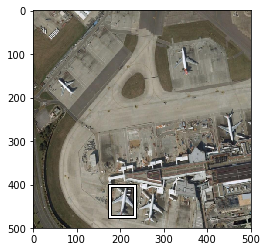

In [385]:
ax = show_img(ima)
draw_rect(ax, b)

In [365]:
#tfms = tfms_from_model(f_model, sz, aug_tfms=transforms_top_down, crop_type=CropType.NO)
#md = ImageClassifierData.from_csv(PATH, 'positive-image-set', CSV_PATH, tfms=tfms, bs=bs)

In [386]:
head_reg4 = nn.Sequential(Flatten(), nn.Linear(512*16*16,4))
learn = ConvLearner.pretrained(f_model, md, custom_head=head_reg4)
learn.opt_fn = optim.Adam
learn.crit = nn.L1Loss()

In [387]:
learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 500, 500]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('trainable', False),
                           ('nb_params', 9408)])),
             ('BatchNorm2d-2',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('trainable', False),
                           ('nb_params', 128)])),
             ('ReLU-3',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('nb_params', 0)])),
             ('MaxPool2d-4',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 125, 125]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 64, 12

In [388]:
learn.lr_find(1e-6, 1e-1)

epoch      trn_loss   val_loss                           
    0      238.235665 602.660725


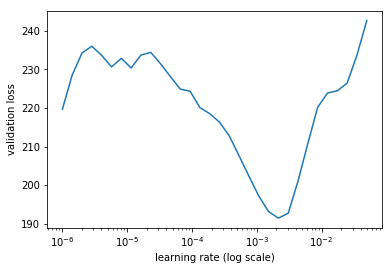

In [389]:
learn.sched.plot(0,0)

In [390]:
lr = 1e-4

In [391]:
learn.fit(lr, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                           
    0      158.229454 135.578449
    1      125.395105 93.249764                          
    2      112.673948 93.125351                          


[array([93.12535])]

In [392]:
lrs = np.array([lr/100,lr/10,lr])

In [393]:
learn.freeze_to(-2)

In [394]:
learn.fit(lrs, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                           
    0      107.741606 95.468013 
    1      103.645465 91.549311                          
    2      100.257105 92.652364                           


[array([92.65236])]

In [395]:
dl = iter(md.val_dl)

In [398]:
x,y = next(dl)
learn.model.eval()
preds = to_np(learn.model(VV(x)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


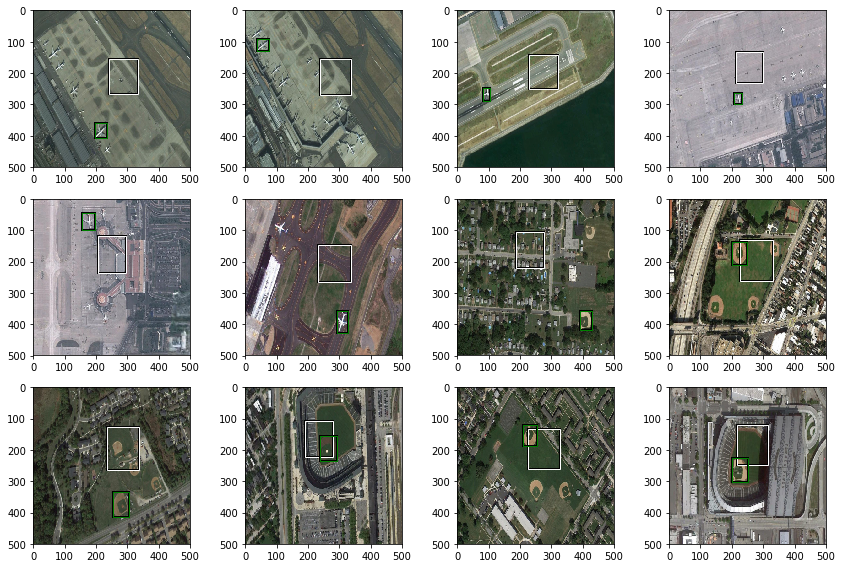

In [399]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(to_np(x))[i]
    b = bb_hw(preds[i])
    ax.imshow(ima)
    p = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='w'))
    draw_outline(p, 2)
    by = bb_hw(y[i])
    p = ax.add_patch(patches.Rectangle(by[:2], *by[-2:], fill=False, edgecolor='g'))
    draw_outline(p, 2)
plt.tight_layout()

## Multiclass

In [409]:
bbs[img_fns[250]]

[[6, array([149, 346, 455, 693])],
 [3, array([116, 270, 183, 370])],
 [3, array([269, 729, 321, 803])]]

In [410]:
def cls_set(bb):
    s = set([b[0] for b in bb])
    return ' '.join([cats[c] for c in s]) 

In [414]:
MC_CSV = PATH / 'mc_df.csv'
df = pd.DataFrame({'fn': img_fns, 'mcat': [cls_set(bbs[img_fn]) for img_fn in img_fns]})

In [415]:
df.tail()

,fn,mcat
645,646.jpg,baseball-diamond basketball-court
646,647.jpg,baseball-diamond ground-track-field
647,648.jpg,baseball-diamond ground-track-field
648,649.jpg,basketball-court
649,650.jpg,basketball-court


In [416]:
df.to_csv(MC_CSV, index=False)

In [426]:
f_model=resnet34
sz=500
bs=16

In [427]:
# tfms = tfms_from_model(f_model, sz, aug_tfms=transforms_top_down, crop_type=CropType.NO)
# md = ImageClassifierData.from_csv(PATH, 'positive-image-set', CSV_PATH, tfms=tfms, bs=bs)
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(PATH, 'positive-image-set', MC_CSV, tfms=tfms, bs=bs)

In [428]:
learn = ConvLearner.pretrained(f_model, md)
learn.opt_fn = optim.Adam

In [429]:
lrf=learn.lr_find(1e-3, 100)

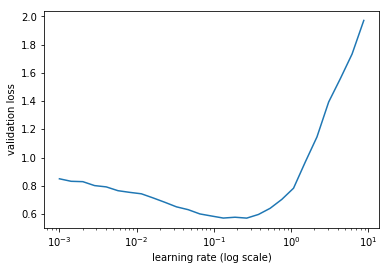

In [430]:
learn.sched.plot(0, 0)

In [431]:
lr = 1e-2

In [432]:
learn.fit(lr, 1, cycle_len=1)

epoch      trn_loss   val_loss   <lambda>                  
    0      0.37364    0.173047   0.937692  


[array([0.17305]), 0.9376923065919143]

In [433]:
lrs = np.array([lr/1000,lr/100,lr])

In [434]:
learn.freeze_to(-2)

In [435]:
learn.fit(lrs, 2, cycle_len=2)

epoch      trn_loss   val_loss   <lambda>                  
    0      0.180383   0.12236    0.954615  
    1      0.113924   0.098435   0.966923                  
    2      0.081236   0.084284   0.977692                   
    3      0.05986    0.077928   0.976923                   


[array([0.07793]), 0.9769230870100168]

In [436]:
dl = iter(md.val_dl)

In [462]:
x,y = next(dl)

In [463]:
p = predict_batch(learn.model, x)

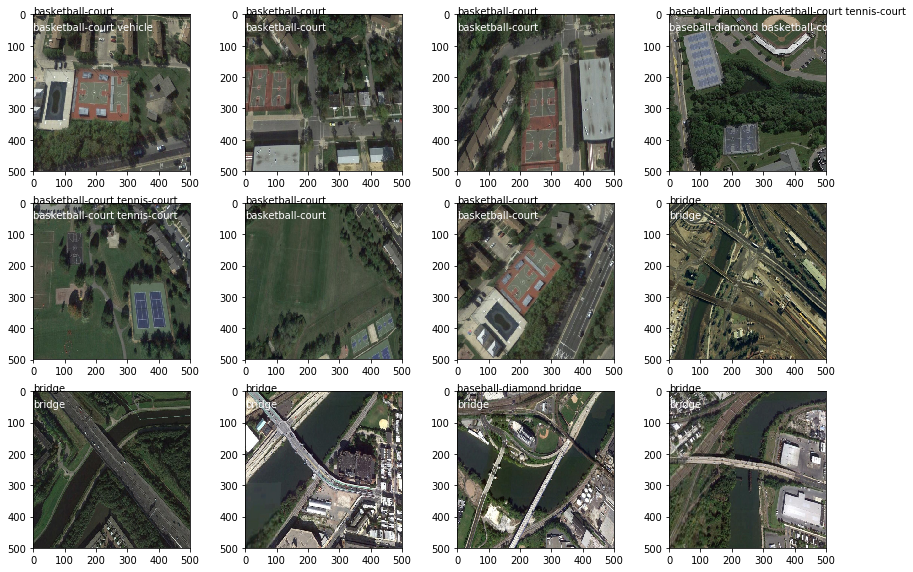

In [464]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    pa = np.nonzero(to_np(p[i])>0.4)[0]
    ya = np.nonzero(to_np(y[i])>0.4)[0]
    pc = ' '.join(md.classes[o] for o in pa)
    yc = ' '.join(md.classes[o] for o in ya)
    ax.imshow(ima)
    ax.text(0, 0, pc)
    ax.text(0, 50, yc, color='w')
plt.tight_layout()

## On to actual SSD - here we go

### The model

In [489]:
n_cat = len(cats); n_cat

10

In [491]:
class StdConv(nn.Module):
    """Standard convolution with NB and Dropout"""
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, kernel_size=3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
    
    def forward(self, x): return self.drop(self.bn(self.conv(x)))

In [492]:
def flatten_conv(x, k):
    """x will have [n_samples, n_channels, n_x, n_y]. Flatten x and y dims.
    Do reshape(shape[0], shape[1]//k, -1) and flip last two dimensions."""
    return x.view(x.size(0), x.size(1)//k, -1).transpose(1, 2)

In [493]:
class OutConv(nn.Module):
    """
    Out conv for SSD. Why set bias?
    Takes as input standard conv.
    Output: 
    1. Conv with ncat filters --> x,y flattened. [n_sample, x*y, ncat]
    2. Conv with nbb=4 filters--> x,y flattened. [n_sample, x*y, nbb=4]
    """
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, n_cat+1, kernel_size=3, stride=1, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, kernel_size=3, stride=1, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k), 
                flatten_conv(self.oconv2(x), self.k)]

In [555]:
class SSD_Head(nn.Module):
    """
    Head on top of backbone. 
    Why stride 1 for first? And only one out
    """
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512, 256, stride=1)
        self.sconv1 = StdConv(256, 256)
        self.sconv2 = StdConv(256, 256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

In [495]:
f_model

<function torchvision.models.resnet.resnet34(pretrained=False, **kwargs)>

In [496]:
md

In [497]:
k=1

In [556]:
# Build model
head = SSD_Head(k, -3.)  #!?!?
models = ConvnetBuilder(f_model, c=0, is_multi=False, is_reg=False, custom_head=head)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

In [557]:
learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 500, 500]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('trainable', False),
                           ('nb_params', 9408)])),
             ('BatchNorm2d-2',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('trainable', False),
                           ('nb_params', 128)])),
             ('ReLU-3',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 250, 250]),
                           ('nb_params', 0)])),
             ('MaxPool2d-4',
              OrderedDict([('input_shape', [-1, 64, 250, 250]),
                           ('output_shape', [-1, 64, 125, 125]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 64, 12

### The data

In [506]:
Dataset

torch.utils.data.dataset.Dataset

In [505]:
md.trn_ds.sz, len(md.trn_ds), md.val_ds.sz, len(md.val_ds)

(500, 520, 500, 130)

https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#dataset-class

In [544]:
class ConcatLblDataset(Dataset):
    """Dataset is a PyTorch class. We basically want a second output."""
    def __init__(self, ds, y2):
        self.ds, self.y2 = ds, y2
        self.sz = ds.sz   # Image size
        
    def __len__(self):
        return len(self.ds) # Number of samples
    
    def __getitem__(self, i):
        x, y = self.ds[i]
        return x, (y, self.y2[i])

In [512]:
bb_concats = [np.concatenate([b[1] for b in bbs[img_fn]]) for img_fn in img_fns]

In [517]:
df = pd.DataFrame({'fn': img_fns, 'bbs': [' '.join(bb.astype(str)) for bb in bb_concats]})

In [527]:
df.tail()

,fn,bbs
645,646.jpg,23 716 112 844 115 399 186 448 115 348 189 401...
646,647.jpg,80 159 469 364 283 478 354 551
647,648.jpg,20 399 82 478 164 458 243 551 423 635 493 711 ...
648,649.jpg,151 383 244 457 148 454 241 530
649,650.jpg,141 480 234 547 137 541 231 611


In [520]:
BBMULTI_CSV = PATH / 'bbmulti_df.csv'
df.to_csv(BBMULTI_CSV, index=False)

In [524]:
cls_concat = np.array([np.array([b[0] for b in bbs[img_fn]]) for img_fn in img_fns])

In [526]:
cls_concat[-3:]

array([array([3, 3, 3, 6]), array([5, 5]), array([5, 5])], dtype=object)

In [529]:
sz

500

In [532]:
val_idxs = get_cv_idxs(len(img_fns)); val_idxs[:5]

array([637, 220, 428, 326,  72])

In [533]:
aug_tfms = [
    RandomRotate(10, tfm_y=TfmType.COORD),
    RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
    RandomFlip(tfm_y=TfmType.COORD)
]
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, 
                       aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(PATH, 'positive-image-set', BBMULTI_CSV, 
                                  bs=bs, tfms=tfms, continuous=True, val_idxs=val_idxs)

In [542]:
((val_cls, trn_cls),) = split_by_idx(val_idxs, cls_concat)

In [545]:
trn_ds_concat = ConcatLblDataset(md.trn_ds, trn_cls)
val_ds_concat = ConcatLblDataset(md.val_ds, val_cls)

In [546]:
md.trn_dl.dataset = trn_ds_concat
md.val_dl.dataset = val_ds_concat

In [548]:
x, y = next(iter(md.trn_dl))

In [554]:
x.size(), y[0][:2], y[1][:2]

(torch.Size([16, 3, 500, 500]), 
 
 Columns 0 to 12 
     0     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0     0
 
 Columns 13 to 25 
     0     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0     0
 
 Columns 26 to 38 
     0     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0     0
 
 Columns 39 to 51 
     0     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0     0
 
 Columns 52 to 64 
     0     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0    85
 
 Columns 65 to 77 
     0     0     0     0     0     0     0   193    

### The loss function

In [591]:
# Create Anchors
anc_grid = 4
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)
anc_y = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
# Anchors contain [x, y, h, w] of all 16 anchors

In [592]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [593]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])
# anchor_cnr contains [x, y] of bottom left and top right corners

In [596]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)

In [597]:
# ('SSD_Head-139',
#               OrderedDict([('input_shape', [-1, 512, 16, 16]),
#                            ('output_shape', [[-1, 16, 11], [-1, 16, 4]]),
#                            ('nb_params', 0)]))])
# So basically the model is predicting 16 bounding boxes plus a corresponding class.

In [598]:
def convert_y(bb_out, cls_out):
    """
    Renormalizes from pixel to [0, 1] and get convenient ys
    
    true_c: [n_max_cls=20] for index --> [n_obj, class_id]
    true_bb: [n_max_cls*4`] with bb in 4 tuples --> [n_obj, bb]
    """
    bb_out = bb_out.view(-1, 4) / sz
    # Throw away non-existing bbs because dataset has n_obj_max objects always!
    bb_keep = ((bb_out[:,2] - bb_out[:, 0])>0).nonzero()[:,0]
    return bb_out[bb_keep], cls_out[bb_keep]

In [599]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    """
    returns a matrix of overlaps for each of the boxes
    """
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [600]:
def map_to_gt(overlaps):
    """
    Takes in n_true_obj * n_anchor_boxes overlap matrix and returns
    for each anchor box: the greatest amount of overlap with any single true box
    and the most probable class for this overlap.
    0 for no class. 
    """
    # Biggest overlap score and anchor box index for each true object
    prior_overlap, prior_idx = overlaps.max(1)
    # For each anchor box, how much overlap is there with a true box
    # and what is the true box index
    gt_overlap, gt_idx = overlaps.max(0)
    # For each true bb, set the overlap for this anchor box to a large value
    gt_overlap[prior_idx] = 1.99
    # for each true bb, set the class of the most overlapping anchor box to the actual class
    for i, o in enumerate(prior_idx): gt_idx[o] = i 
    return gt_overlap, gt_idx

In [601]:
def actn_to_bb(actn, anchors):
    """
    Erm, let me just assume that this is correct.
    """
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

In [602]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(n_cat)

In [603]:
def ssd_1_loss(cls_out, bb_out, true_bb, true_c):
    """
    Loss for one sample.
    cls_out: [all_boxes, one_hot_class]
    bb_out:  [all_boxes, bb]
    true_c: [n_max_cls=20] for index
    true_bb: [n_max_cls*4] with bb in 4 tuples
    """
    # (Dataset step) Reshape truth to [n_obj, bb] and [n_obj, class_id]
    true_bb, true_c = convert_y(true_bb, true_c)
    
    # Compute IOU for each true object with each anchor box
    overlaps = jaccard(true_bb.data, anchor_cnr.data)
    
    # Get the overlap and class for each bounding box
    gt_overlap, gt_idx = map_to_gt(overlaps)
    gt_cls =  true_c[gt_idx]   # This is the actual class
    
    # Only get overlaps with greater 0.4
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:, 0]
    
    # set all that do not have enough overlap to the bg cls index
    gt_cls[1-pos] = n_cat
    
    # For each anchor box, set the bb coords to the corresponding true bb (bg doesn't matter)
    gt_bbox = true_bb[gt_idx]
    
    # (Dataset step) Transform the predictions to compute localization loss
    a_ic = actn_to_bb(bb_out, anchors)
    
    # Compute the localization loss (L1)
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    
    # compute the class loss
    clas_loss = loss_f(cls_out, gt_cls)
    
    return loc_loss, clas_loss
    

In [604]:
def ssd_loss(pred, targ, alpha=1.):
    """
    Loss is weighted sum of localization loww lloc and confidence loss lcls
    """
    lcls, lloc = 0., 0.
    for cls_out, bb_out, true_bb, true_c in zip(*pred, *targ):   # Loop over samples
        lloc1, lcls1 = ssd_1_loss(cls_out, bb_out, true_bb, true_c)   # Loss for one sample
        lloc += lloc1; lcls += lcls1   # Add up for all objects
    return lcls + alpha*lloc

In [605]:
learn.crit = ssd_loss

In [606]:
learn.lr_find()

 85%|████████▍ | 28/33 [00:12<00:02,  2.18it/s, loss=82]  

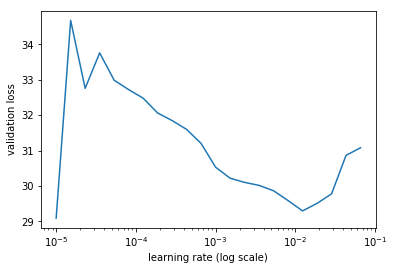

In [608]:
learn.sched.plot(0)

In [609]:
lr = 3e-3

In [610]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      24.429671  29.981629 
    1      21.572114  22.800707                           
    2      19.871628  20.339847                           
    3      18.52079   19.451581                           
    4      17.504058  19.021389                           


[array([19.02139])]

### testing

In [640]:
dl = iter(md.val_dl)

In [644]:
x,y = next(dl)
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(V(x))
b_clas,b_bb = batch

In [645]:
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = convert_y(y[0][idx], y[1][idx])
bbox,clas

(Variable containing:
  0.0960  0.1680  0.8380  0.4480
  0.7340  0.6780  0.8820  0.7220
  0.7440  0.7240  0.8880  0.7660
  0.7500  0.7700  0.8920  0.8140
  0.7540  0.8120  0.8980  0.8580
  0.2060  0.4820  0.3620  0.5940
  0.7180  0.4120  0.8620  0.5060
  0.4780  0.8060  0.6180  0.9080
 [torch.cuda.FloatTensor of size 8x4 (GPU 0)], Variable containing:
  6
  4
  4
  4
  4
  3
  3
  3
 [torch.cuda.LongTensor of size 8 (GPU 0)])

In [646]:
def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [647]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [648]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(cats) else cats[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [649]:
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*sz).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

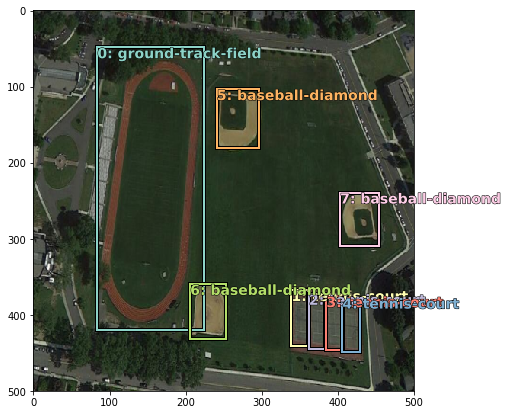

In [650]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, bbox, clas)

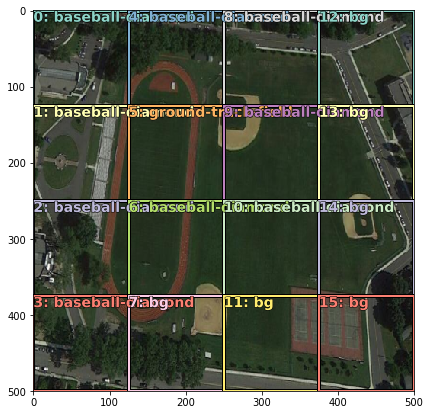

In [651]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

In [652]:
a_ic = actn_to_bb(b_bboxi, anchors)

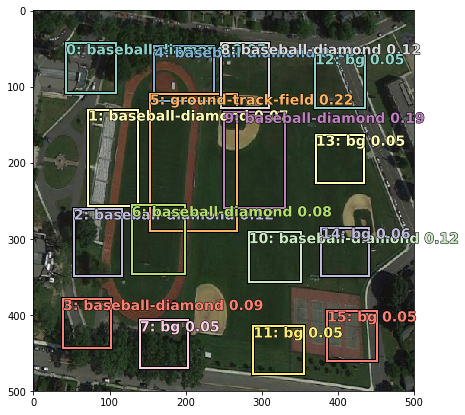

In [653]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [633]:
dl = iter(md.val_dl)

In [638]:
x,y = next(dl)
learn.model.eval()
preds = learn.model(VV(x))

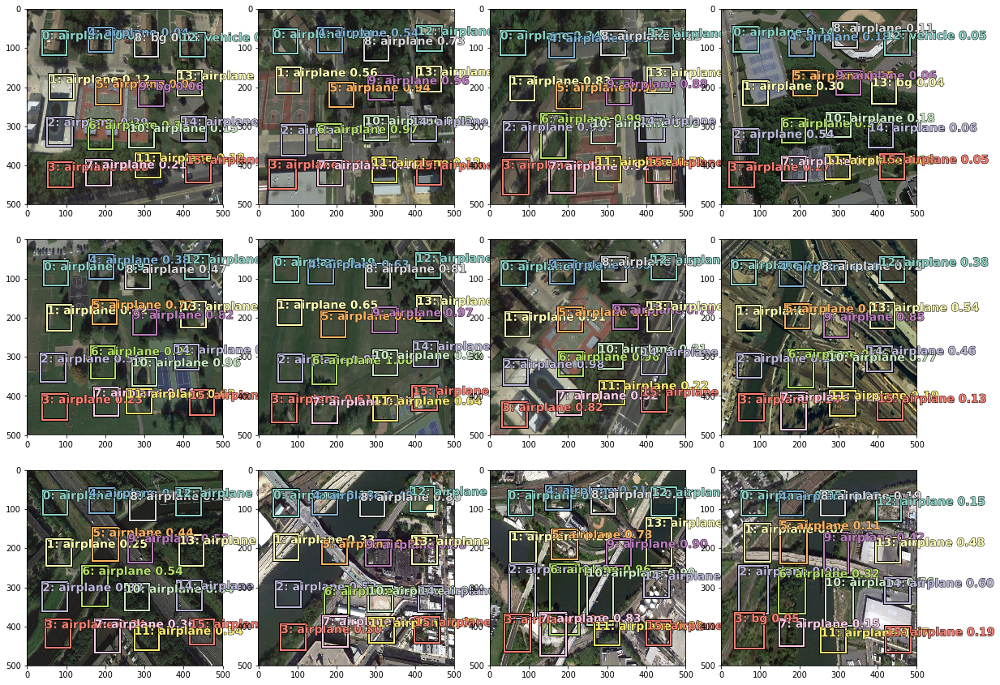

In [639]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = convert_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = convert_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

# Old stuff

In [6]:
trn_j = json.load((PATH / 'pascal_train2007.json').open())

In [7]:
trn_j.keys()

dict_keys(['images', 'type', 'annotations', 'categories'])

In [8]:
trn_j['images'][:3], len(trn_j['images'])

([{'file_name': '000012.jpg', 'height': 333, 'width': 500, 'id': 12},
  {'file_name': '000017.jpg', 'height': 364, 'width': 480, 'id': 17},
  {'file_name': '000023.jpg', 'height': 500, 'width': 334, 'id': 23}],
 2501)

In [9]:
trn_ids = [o['id'] for o in trn_j['images']]

In [10]:
trn_fns = {o['id']: o['file_name'] for o in trn_j['images']}

In [11]:
trn_j['annotations'][:3], len(trn_j['annotations'])

([{'segmentation': [[155, 96, 155, 270, 351, 270, 351, 96]],
   'area': 34104,
   'iscrowd': 0,
   'image_id': 12,
   'bbox': [155, 96, 196, 174],
   'category_id': 7,
   'id': 1,
   'ignore': 0},
  {'segmentation': [[184, 61, 184, 199, 279, 199, 279, 61]],
   'area': 13110,
   'iscrowd': 0,
   'image_id': 17,
   'bbox': [184, 61, 95, 138],
   'category_id': 15,
   'id': 2,
   'ignore': 0},
  {'segmentation': [[89, 77, 89, 336, 403, 336, 403, 77]],
   'area': 81326,
   'iscrowd': 0,
   'image_id': 17,
   'bbox': [89, 77, 314, 259],
   'category_id': 13,
   'id': 3,
   'ignore': 0}],
 7844)

In [12]:
trn_bb = defaultdict(list)
for o in trn_j['annotations']:
    bb = o['bbox']
    bb = np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1])
    trn_bb[o['image_id']].append((o['category_id'], bb))

In [13]:
len(trn_bb)

2501

In [14]:
trn_j['categories']

[{'supercategory': 'none', 'id': 1, 'name': 'aeroplane'},
 {'supercategory': 'none', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'none', 'id': 3, 'name': 'bird'},
 {'supercategory': 'none', 'id': 4, 'name': 'boat'},
 {'supercategory': 'none', 'id': 5, 'name': 'bottle'},
 {'supercategory': 'none', 'id': 6, 'name': 'bus'},
 {'supercategory': 'none', 'id': 7, 'name': 'car'},
 {'supercategory': 'none', 'id': 8, 'name': 'cat'},
 {'supercategory': 'none', 'id': 9, 'name': 'chair'},
 {'supercategory': 'none', 'id': 10, 'name': 'cow'},
 {'supercategory': 'none', 'id': 11, 'name': 'diningtable'},
 {'supercategory': 'none', 'id': 12, 'name': 'dog'},
 {'supercategory': 'none', 'id': 13, 'name': 'horse'},
 {'supercategory': 'none', 'id': 14, 'name': 'motorbike'},
 {'supercategory': 'none', 'id': 15, 'name': 'person'},
 {'supercategory': 'none', 'id': 16, 'name': 'pottedplant'},
 {'supercategory': 'none', 'id': 17, 'name': 'sheep'},
 {'supercategory': 'none', 'id': 18, 'name': 'sofa'},
 {'super

In [15]:
cats = {o['id']: o['name'] for o in trn_j['categories']}

### Plot the images with bounding boxes

In [60]:
from matplotlib import patches, patheffects

In [61]:
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1],a[2]-a[0]])

In [62]:
def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

In [63]:
def plot_img_bb(img_id, bbs=trn_bb):
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    img = Image.open(IMG_PATH / trn_fns[img_id])
    ax.imshow(img)
    bbs = bbs[img_id]
    if not type(bbs) is list: bbs = [bbs]
    for o in bbs:
        cat, bb  = o[0], bb_hw(o[1])
        p = ax.add_patch(patches.Rectangle(bb[:2], *bb[-2:], fill=False, edgecolor='w'))
        draw_outline(p, 2)
        t = ax.text(bb[0], bb[1], cats[cat], color='w', fontsize=12, 
                    verticalalignment='top')
        draw_outline(t, 2)

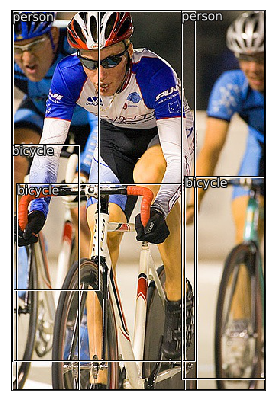

In [20]:
plot_img_bb(trn_ids[2])

## Largest object classifier

In [21]:
tmp = trn_bb[trn_ids[2]]

In [22]:
tmp

[(2, array([229,   8, 499, 244])),
 (2, array([219, 229, 499, 333])),
 (2, array([177,   1, 499,  89])),
 (15, array([  0,   1, 368, 116])),
 (15, array([  1,   2, 461, 242])),
 (15, array([  0, 224, 485, 333]))]

In [23]:
def get_largest(bbs):
    return sorted(bbs, key=lambda x: bb_hw(x[1])[2] * bb_hw(x[1])[3], reverse=True)[0]

In [24]:
trn_bb_lrg = {id: get_largest(trn_bb[id]) for id in trn_ids}

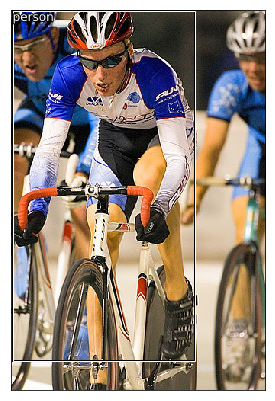

In [25]:
plot_img_bb(trn_ids[2], trn_bb_lrg)

In [26]:
lrg_df = pd.DataFrame(
    {'fn': [trn_fns[id] for id in trn_ids], 
     'cat': [cats[trn_bb_lrg[id][0]] for id in trn_ids]}, 
    columns = ['fn', 'cat'])

In [27]:
lrg_df.tail()

,fn,cat
2496,009944.jpg,motorbike
2497,009945.jpg,sheep
2498,009949.jpg,person
2499,009959.jpg,car
2500,009961.jpg,dog


In [28]:
lrg_df.to_csv(PATH / 'lrg_df.csv', index=False)

### Pretrained model

In [29]:
f_model = resnet34
sz = 224
bs=64

In [30]:
tfms = tfms_from_model(f_model, sz, aug_tfms=transforms_side_on, crop_type=CropType.NO)

In [31]:
md = ImageClassifierData.from_csv(PATH, IMG_PATH, PATH/ 'lrg_df.csv', tfms=tfms)

In [32]:
x, y=next(iter(md.val_dl))

In [33]:
x


( 0 , 0 ,.,.) = 
  3.9125e-01  4.3014e-01  4.8172e-01  ...   1.7518e-01  3.2367e-01  4.0783e-01
  5.1636e-01  4.4973e-01  5.9202e-01  ...   1.7386e-01  2.3164e-01  3.6722e-01
  5.4416e-01  5.7267e-01  7.0099e-01  ...   5.7682e-02  2.2320e-01  3.5455e-01
                 ...                   ⋱                   ...                
  1.4604e+00  1.5029e+00  1.5195e+00  ...   7.8030e-01  5.6716e-01 -6.3922e-01
  9.3739e-01  1.0210e+00  1.1599e+00  ...   1.1281e+00  1.0895e+00  4.5857e-01
  5.8584e-01  4.5245e-01  2.9605e-01  ...   1.0003e+00  9.2495e-01  8.2729e-01

( 0 , 1 ,.,.) = 
  2.4041e-01  3.1444e-01  4.1422e-01  ...   3.3162e-01  4.7052e-01  5.4764e-01
  3.9737e-01  4.2156e-01  5.7304e-01  ...   3.3887e-01  3.8799e-01  5.2038e-01
  5.2462e-01  5.8245e-01  6.7485e-01  ...   2.5190e-01  4.0003e-01  5.1502e-01
                 ...                   ⋱                   ...                
  1.4721e+00  1.5019e+00  1.5077e+00  ...   6.0917e-01  4.4337e-01 -7.3978e-01
  8.4169e-01  9.

In [64]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return ax

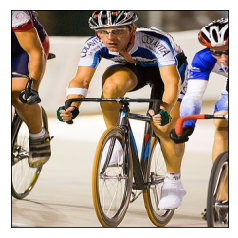

In [35]:
show_img(md.val_ds.denorm(to_np(x))[0]);

In [ ]:
learn = ConvLearner.pretrained(f_model, md, metrics=[accuracy])

In [36]:
learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('trainable', False),
                           ('nb_params', 9408)])),
             ('BatchNorm2d-2',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('trainable', False),
                           ('nb_params', 128)])),
             ('ReLU-3',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('nb_params', 0)])),
             ('MaxPool2d-4',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 56, 56]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 64, 56, 

In [235]:
learn.opt_fn = optim.Adam

In [236]:
lrf = learn.lr_find()

 91%|█████████ | 29/32 [00:20<00:02,  1.41it/s, loss=10.3]

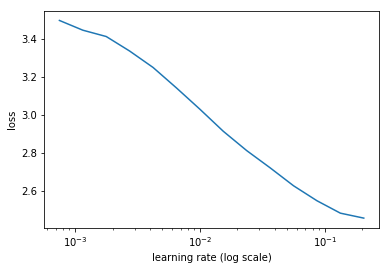

In [237]:
learn.sched.plot()

In [238]:
lr = 2e-2

In [241]:
learn.fit(lr, 1, cycle_len=1)

epoch      trn_loss   val_loss   accuracy                 
    0      1.307141   0.864851   0.761569  


[0.8648515, 0.761568509042263]

In [246]:
lrs = np.array([lr/1000,lr/100,lr])

In [247]:
learn.freeze_to(-2)

 84%|████████▍ | 27/32 [00:44<00:08,  1.63s/it, loss=4.63] 

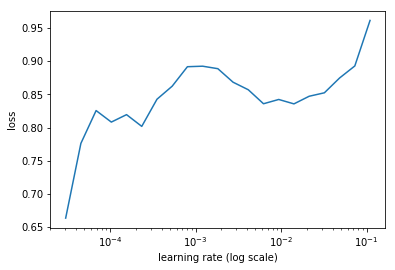

In [248]:
lrf=learn.lr_find(lrs/1000)
learn.sched.plot(1)

In [250]:
import tqdm

In [251]:
learn.fit(lrs/5, 1, cycle_len=1)

epoch      trn_loss   val_loss   accuracy                  
    0      0.829375   0.744322   0.783504  


[0.74432206, 0.7835036069154739]

In [252]:
learn.unfreeze()

In [253]:
learn.fit(lrs/5, 1, cycle_len=2)

epoch      trn_loss   val_loss   accuracy                  
    0      0.621855   0.808581   0.782602  
    1      0.459543   0.731533   0.803035                  


[0.73153293, 0.8030348569154739]

In [254]:
learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('trainable', True),
                           ('nb_params', 9408)])),
             ('BatchNorm2d-2',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('trainable', True),
                           ('nb_params', 128)])),
             ('ReLU-3',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('nb_params', 0)])),
             ('MaxPool2d-4',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 56, 56]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 64, 56, 56

### Train from scratch

https://github.com/fastai/fastai/blob/master/courses/dl1/lesson7-cifar10.ipynb

In [34]:
class BnLayer(nn.Module):
    def __init__(self, ni, nf, stride=2, kernel_size=3):
        super().__init__()
        self.conv = nn.Conv2d(ni, nf, kernel_size=kernel_size, stride=stride,
                              bias=False, padding=1)
        self.a = nn.Parameter(torch.zeros(nf,1,1))
        self.m = nn.Parameter(torch.ones(nf,1,1))
        
    def forward(self, x):
        x = F.relu(self.conv(x))
        x_chan = x.transpose(0,1).contiguous().view(x.size(1), -1)
        if self.training:
            self.means = x_chan.mean(1)[:,None,None]
            self.stds  = x_chan.std (1)[:,None,None]
        return (x-self.means) / self.stds *self.m + self.a
class ResnetLayer(BnLayer):
    def forward(self, x): return x + super().forward(x)

In [61]:
class Resnet2(nn.Module):
    def __init__(self, layers, c, p=0.5):
        super().__init__()
        self.conv1 = BnLayer(3, 16, stride=1, kernel_size=7)
        self.layers = nn.ModuleList([BnLayer(layers[i], layers[i+1])
            for i in range(len(layers) - 1)])
        self.layers2 = nn.ModuleList([ResnetLayer(layers[i+1], layers[i + 1], 1)
            for i in range(len(layers) - 1)])
        self.layers3 = nn.ModuleList([ResnetLayer(layers[i+1], layers[i + 1], 1)
            for i in range(len(layers) - 1)])
        self.out = nn.Linear(layers[-1], c)
        self.drop = nn.Dropout(p)
        
    def forward(self, x):
        x = self.conv1(x)
        for l,l2,l3 in zip(self.layers, self.layers2, self.layers3):
            x = l3(l2(l(x)))
        x = F.adaptive_max_pool2d(x, 1)
        x = x.view(x.size(0), -1)
        x = self.drop(x)
        return F.log_softmax(self.out(x), dim=-1)

In [62]:
my_learn = ConvLearner.from_model_data(Resnet2([16, 32, 64, 128, 256], 20, 0.2), md)

In [63]:
my_learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 16, 220, 220]),
                           ('trainable', True),
                           ('nb_params', 2352)])),
             ('BnLayer-2',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 16, 220, 220]),
                           ('nb_params', 0)])),
             ('Conv2d-3',
              OrderedDict([('input_shape', [-1, 16, 220, 220]),
                           ('output_shape', [-1, 32, 110, 110]),
                           ('trainable', True),
                           ('nb_params', 4608)])),
             ('BnLayer-4',
              OrderedDict([('input_shape', [-1, 16, 220, 220]),
                           ('output_shape', [-1, 32, 110, 110]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 32, 110, 110

In [64]:
opt_fn = partial(optim.Adam)

In [65]:
my_learn.crit = F.nll_loss

In [66]:
my_learn.opt_fn = optim.Adam

In [67]:
my_learn.lr_find()

 78%|███████▊  | 25/32 [00:12<00:03,  2.06it/s, loss=8.78]

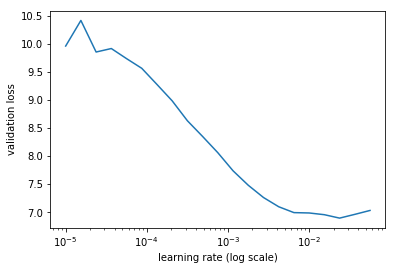

In [69]:
my_learn.sched.plot(0, 3)

In [70]:
lr = 1e-3
wd = 1e-6

In [71]:
my_learn.fit(lr, 2, cycle_len=2, wds=wd)

epoch      trn_loss   val_loss   accuracy                 
    0      4.614759   2.928633   0.246     
    1      3.533968   2.552393   0.254                    
    2      3.193371   2.619998   0.276                    
    3      2.885322   2.402542   0.296                    


[array([2.40254]), 0.2960000011920929]

In [72]:
lr = 1e-4

In [73]:
my_learn.fit(lr, 2, cycle_len=3, cycle_mult=2 , wds=wd)

epoch      trn_loss   val_loss   accuracy                 
    0      2.506186   2.494185   0.292     
    1      2.438319   2.346702   0.292                    
    2      2.399167   2.314342   0.318                    
    3      2.393828   2.428568   0.296                    
    4      2.370104   2.269139   0.302                    
    5      2.302039   2.269669   0.33                     
    6      2.270626   2.264354   0.304                    
    7      2.231869   2.453192   0.32                     
    8      2.184331   2.234639   0.322                    


[array([2.23464]), 0.3220000014305115]

In [83]:
x,y = next(iter(md.val_dl))
probs = F.softmax(predict_batch(my_learn.model, x), -1)
x,preds = to_np(x),to_np(probs)
preds = np.argmax(preds, -1)

In [84]:
preds

array([13, 14,  7, 14, 14,  6, 18, 17,  6,  2, 14,  6, 17, 14, 12,  0, 14, 14, 14, 14, 18,  6,  6,  6, 14,
        6,  6, 14, 14,  6,  6,  0, 18,  6,  6, 14, 14,  6,  0,  6, 14, 13,  6, 14,  3, 14, 14,  6, 14,  6,
       12, 14, 14, 14, 14,  7,  6,  0,  7,  3, 14, 14, 14, 14])

In [81]:
??draw_text

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


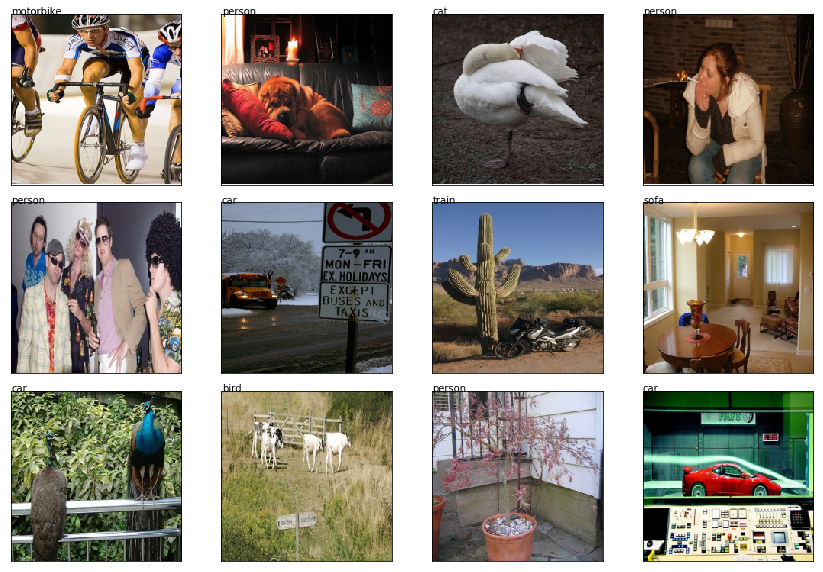

In [82]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    b = md.classes[preds[i]]
    ax = show_img(ima, ax=ax)
    #draw_text(ax, (0,0), b)
    ax.text(0, 0, b)
plt.tight_layout()

## BBs only

In [28]:
bb_df = pd.DataFrame(
    {'fn': [trn_fns[id] for id in trn_ids], 
     'bb': [' '.join(str(b) for b in trn_bb_lrg[id][1]) for id in trn_ids]}, 
    columns = ['fn', 'bb'])

In [29]:
bb_df.to_csv(PATH / 'bb_df.csv', index=False)

In [30]:
bb_df.head()

,fn,bb
0,000012.jpg,96 155 269 350
1,000017.jpg,77 89 335 402
2,000023.jpg,1 2 461 242
3,000026.jpg,124 89 211 336
4,000032.jpg,77 103 182 374


### Pretrained model

In [36]:
f_model=resnet34
sz=224
bs=64

In [37]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD)

In [38]:
md = ImageClassifierData.from_csv(PATH, 'JPEGImages', PATH/ 'bb_df.csv', tfms=tfms, continuous=True)

In [93]:
head_reg4 = nn.Sequential(Flatten(), nn.Linear(25088, 4))

In [94]:
learn = ConvLearner.pretrained(f_model, md, custom_head=head_reg4)
learn.opt_fn = optim.Adam
learn.crit = nn.L1Loss()

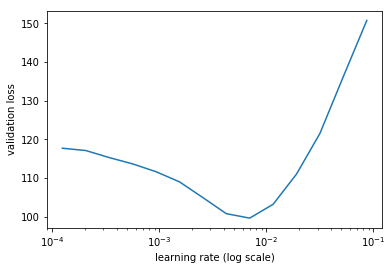

In [95]:
learn.lr_find(1e-5,100)
learn.sched.plot(5)

In [96]:
lr = 2e-3

In [97]:
learn.fit(lr, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                            
    0      49.171924  35.071456 
    1      36.919292  27.917541                           
    2      30.763059  27.289077                           


[array([27.28908])]

In [98]:
lrs = np.array([lr/100,lr/10,lr])

In [99]:
learn.freeze_to(-2)

In [101]:
learn.fit(lrs, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                            
    0      25.826559  23.0386   
    1      22.262047  22.213562                           
    2      18.201179  20.892107                           


[array([20.89211])]

In [102]:
learn.freeze_to(-3)

In [103]:
learn.fit(lrs, 1, cycle_len=2)

epoch      trn_loss   val_loss                            
    0      16.015375  21.804226 
    1      14.465886  20.717461                           


[array([20.71746])]

In [104]:
x,y = next(iter(md.val_dl))
learn.model.eval()
preds = to_np(learn.model(VV(x)))

In [106]:
def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


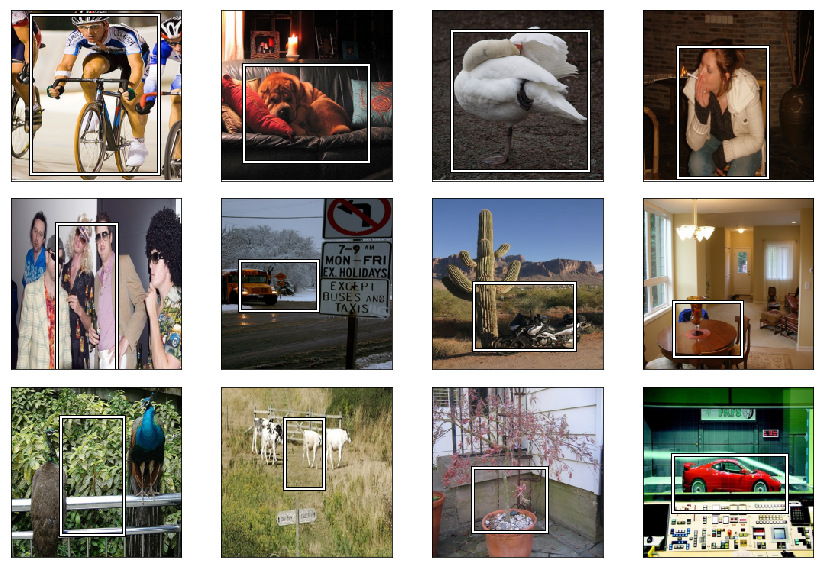

In [107]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(to_np(x))[i]
    b = bb_hw(preds[i])
    ax = show_img(ima, ax=ax)
    draw_rect(ax, b)
plt.tight_layout()

### From scratch

In [47]:
class Resnet2_reg(nn.Module):
    def __init__(self, layers, c, p=0.5):
        super().__init__()
        self.conv1 = BnLayer(3, 16, stride=1, kernel_size=7)
        self.layers = nn.ModuleList([BnLayer(layers[i], layers[i+1])
            for i in range(len(layers) - 1)])
        self.layers2 = nn.ModuleList([ResnetLayer(layers[i+1], layers[i + 1], 1)
            for i in range(len(layers) - 1)])
        self.layers3 = nn.ModuleList([ResnetLayer(layers[i+1], layers[i + 1], 1)
            for i in range(len(layers) - 1)])
        self.out = nn.Linear(256*7*7, c)
        self.drop = nn.Dropout(p)
        
    def forward(self, x):
        x = self.conv1(x)
        for l,l2,l3 in zip(self.layers, self.layers2, self.layers3):
            x = l3(l2(l(x)))
        x = x.view(x.size(0), -1)
        #x = nn.Linear(x.size(0), 4)(x)
        return self.out(x)

In [48]:
my_learn = ConvLearner.from_model_data(Resnet2_reg([16, 32, 64, 128, 256, 256], 4, 0.2), md)

In [49]:
my_learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 16, 220, 220]),
                           ('trainable', True),
                           ('nb_params', 2352)])),
             ('BnLayer-2',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 16, 220, 220]),
                           ('nb_params', 0)])),
             ('Conv2d-3',
              OrderedDict([('input_shape', [-1, 16, 220, 220]),
                           ('output_shape', [-1, 32, 110, 110]),
                           ('trainable', True),
                           ('nb_params', 4608)])),
             ('BnLayer-4',
              OrderedDict([('input_shape', [-1, 16, 220, 220]),
                           ('output_shape', [-1, 32, 110, 110]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 32, 110, 110

In [50]:
my_learn.opt_fn = optim.Adam
my_learn.crit = nn.L1Loss()

In [51]:
my_learn.lr_find(1e-5,100)

 75%|███████▌  | 24/32 [00:11<00:03,  2.01it/s, loss=110] 

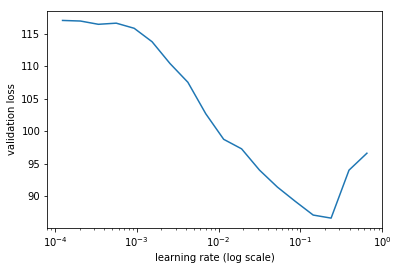

In [52]:
my_learn.sched.plot(5, 0)

In [53]:
lr = 2e-3

In [54]:
my_learn.fit(lr, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                            
    0      47.288696  35.157158 
    1      39.073773  33.53347                            
    2      35.363925  32.831224                           


[array([32.83122])]

In [55]:
lr = 1e-3

In [56]:
my_learn.fit(lr, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                            
    0      32.971272  32.071664 
    1      32.259794  31.013573                           
    2      31.094216  30.546807                           


[array([30.54681])]

In [57]:
x,y = next(iter(md.val_dl))
my_learn.model.eval()
preds = to_np(my_learn.model(VV(x)))

In [58]:
def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


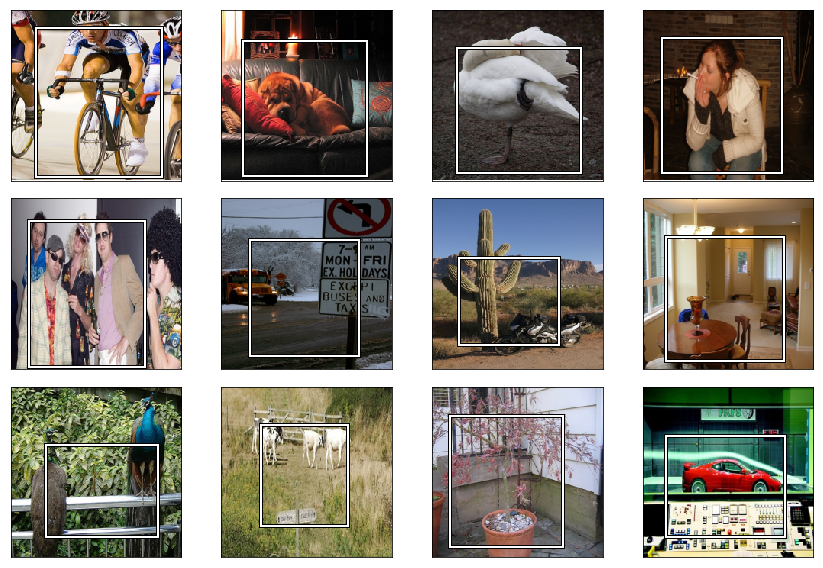

In [65]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(to_np(x))[i]
    b = bb_hw(preds[i])
    ax = show_img(ima, ax=ax)
    draw_rect(ax, b)
plt.tight_layout()

In [67]:
md.val_y.shape, md.trn_y.shape

((500, 4), (2001, 4))